# Ising2D

* Copyright (c) 2020 Gen Kuroki
* License: MIT
* Repository: https://github.com/genkuroki/Ising2D.jl

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Benchmark" data-toc-modified-id="Benchmark-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Benchmark</a></span></li><li><span><a href="#Examples" data-toc-modified-id="Examples-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Examples</a></span></li><li><span><a href="#Documents" data-toc-modified-id="Documents-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Documents</a></span></li></ul></div>

In [1]:
]activate .

 Activating environment at `C:\Users\genkuroki\OneDrive\Ising2D.jl\Project.toml`


In [2]:
using Revise

In [3]:
using Ising2D, Plots, Random

In [4]:
Random.seed!(464937337564);

## Benchmark

  9.910638 seconds (3 allocations: 10.188 KiB)


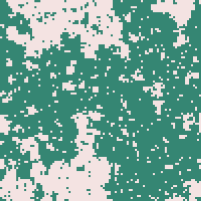

In [5]:
using Ising2D
@time s = ising2d!(rand_ising2d(), β_ising2d, 10^5)
plot_ising2d(s)

In [6]:
using Ising2D, BenchmarkTools
print("VERSION = $VERSION:")
s = rand_ising2d()
@btime ising2d!($s);

VERSION = 1.6.0-DEV.584:  96.604 ms (1 allocation: 160 bytes)


## Examples

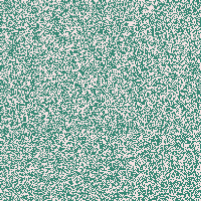

In [7]:
s = rand_ising2d(200)
P0 = plot_ising2d(s)

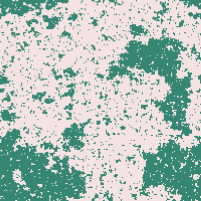

In [8]:
ising2d!(s, β_ising2d, 500)
P1 = plot_ising2d(s)

In [9]:
png(P0, "s0.png")
png(P1, "s1.png")

 75.321869 seconds (1.25 G allocations: 29.172 GiB, 3.22% gc time)


┌ Info: Saved animation to 
│   fn = C:\Users\genkuroki\OneDrive\Ising2D.jl\ising2d.gif
└ @ Plots C:\Users\genkuroki\.julia\packages\Plots\ViMfq\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\genkuroki\\OneDrive\\Ising2D.jl\\ising2d.gif")
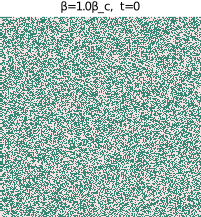

In [10]:
s = rand_ising2d(200)
@time gif_ising2d(s=s, k=1.0, nwarmups=0, nskips=1, niters=500, fps=15)

energy_density_ising2d(s₀) = 0.0048
magnetization_ising2d(s₀) = -0.0206
 50.736013 seconds (42.26 k allocations: 51.362 MiB, 0.02% gc time)
mean(E) = -1.41806064
mean(M) = 0.25986948000000004


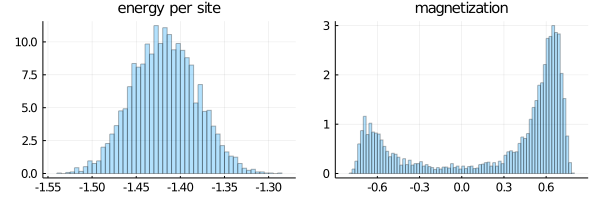

In [11]:
s₀ = rand_ising2d()
@show energy_density_ising2d(s₀)
@show magnetization_ising2d(s₀)
s = copy(s₀)
@time S = mcmc_ising2d!(s=s, k=1.0, nwarmups=1000, nskips=100, niters=5000)
E = energy_density_ising2d.(S)
M = magnetization_ising2d.(S)
@show mean(E)
@show mean(M)

histogram_mcmc_ising2d(S)

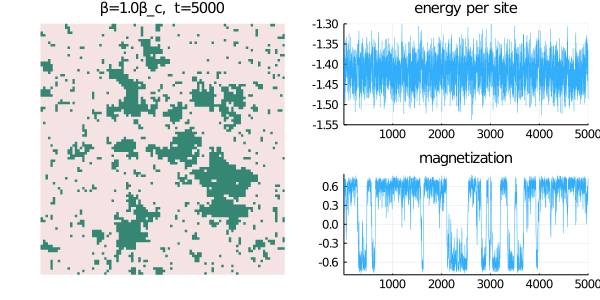

In [12]:
plot_mcmc_ising2d(S)

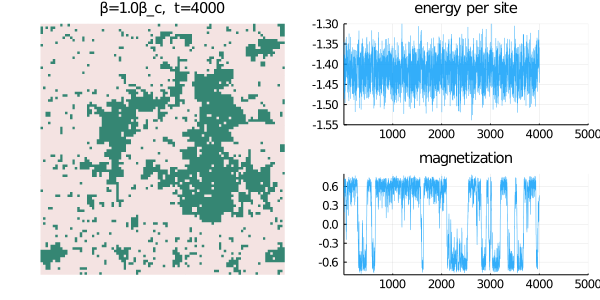

In [13]:
plot_mcmc_ising2d(S; t=4000)

 56.904516 seconds (311.16 M allocations: 8.007 GiB, 1.68% gc time)


┌ Info: Saved animation to 
│   fn = C:\Users\genkuroki\OneDrive\Ising2D.jl\ising2d_mcmc.gif
└ @ Plots C:\Users\genkuroki\.julia\packages\Plots\ViMfq\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\genkuroki\\OneDrive\\Ising2D.jl\\ising2d_mcmc.gif")
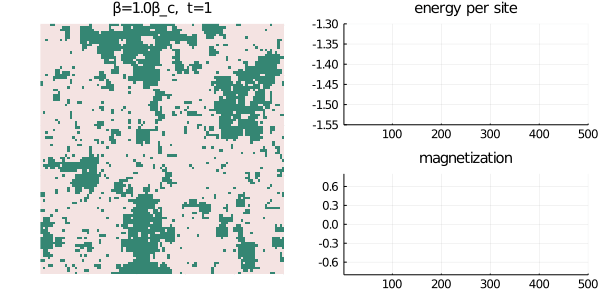

In [14]:
@time gif_mcmc_ising2d(S[10:10:end])

## Documents

In [15]:
@doc Ising2D

Ising2D is a simple Julia module of 2D Ising model.

Benchmark:

```julia
using Ising2D, BenchmarkTools
s = rand_ising2d()
print("VERSION = $VERSION:")
@btime ising2d!($s);
```


In [16]:
@doc Ising2D.β_ising2d

```
β_ising2d = log(1 + √2)/2
```

is the critical inverse temperature of the 2-dimensional Ising model on the square lattice.


In [17]:
@doc Ising2D.rand_ising2d

```
rand_ising2d(rng::AbstractRNG, m=100, n=m)
rand_ising2d(m=100, n=m)
```

generate the random state of the 2-dimensional Ising model.


In [18]:
@doc Ising2D.ising2d!

```
ising2d!(s=rand_ising2d(), β=β_ising2d, niters=10^3, rng=default_rng())
```

updates the 2-dimensional array `s` with values ±1 randomly by the 2-dimensional Ising model rule.

Example: 

```julia
using Ising2D
@time s = ising2d!(rand_ising2d(), β_ising2d, 10^5)
plot_ising2d(s)
```


In [19]:
@doc Ising2D.plot_ising2d

```
plot_ising2d(s; size=(201.5, 201.5), color=:gist_earth, clim=(-2, 1.1), kwargs...)
```

plots the state `s` of the 2-dimensional Ising model.


In [20]:
@doc Ising2D.gif_ising2d

```
gif_ising2d(; s=rand_ising2d(), k=1.0, β=k*β_ising2d, rng=default_rng(),
    nwarmups=0, nskips=10, niters=100, 
    gifname="ising2d.gif", fps=10,
    size=(201.5, 217.5), color=:gist_earth, clim=(-2, 1.1), kwargs...
)
```

creates the gif animation of 2D Ising model.

Example: To create a 200x200 GIF animation, run

```julia
gif_ising2d(s=rand_ising2d(200))
```


In [21]:
@doc Ising2D.mcmc_ising2d!

```
mcmc_ising2d!(; s=rand_ising2d(), k=1.0, β=k*β_ising2d, rng=default_rng(),
    nwarmups=1000, nskips=100, niters=5000
)
```

returns the result of the Markov Chain Monte Carlo simulation with length niters, which is the array of the states of 2D Ising model.


In [22]:
@doc Ising2D.energy_density_ising2d

```
energy_ising2d(s)
```

returns the energy density (energy per site) of the state `s` of 2D Ising model.


In [23]:
@doc Ising2D.magnetization_ising2d

```
magnetization_ising2d(s)
```

returns the magnetization of the state `s` of 2D Ising model.


In [24]:
@doc Ising2D.plot_mcmc_ising2d

```
plot_mcmc_ising2d(S, E=nothing, M=nothing;
    k=1.0, β=k*β_ising2d, niters=length(S), t=niters,   
    ylim_E=(-1.50, -1.35), ylim_M=(-0.75, 0.75), lw=0.5, alpha=0.8,
    size=(600, 300), color=:gist_earth, clim=(-2, 1.1), kwargs...
)
```

plots the MCMC result S with energy per site and magnetization.


In [25]:
@doc Ising2D.histogram_mcmc_ising2d

```
histogram_mcmc_ising2d(S, E=nothing, M=nothing;
    niters=length(S), bin=min(100, max(10, round(Int, 1.2*√niters))), 
    size=(600, 200), kwargs...
)
```

plots the histogram of energy per site and magnetization of the MCMC result S.


In [26]:
@doc Ising2D.gif_mcmc_ising2d

```
gif_mcmc_ising2d(S=nothing, E=nothing, M=nothing;
    s=rand_ising2d(), k=1.0, β=k*β_ising2d, rng=default_rng(),
    nwarmups=1000, nskips=1000, niters=500,
    ylim_E=(-1.55, -1.30), ylim_M=(-0.8, 0.8), lw=1.0, alpha=0.8,
    gifname="ising2d_mcmc.gif", fps=10,
    size=(600, 300), color=:gist_earth, clim=(-2, 1.1), kwargs...
)
```

creates the gif animation of 2D Ising model with energy per site and magnetization.

Example:

```
gif_mcmc_ising2d()
```
